In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from sklearn import tree

In [2]:
df=pd.read_csv('winequality_red.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
 ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

###### We will study about data set from PandasProfiling. In this dataset we see there are no missing value  but there are Zero values and Duplicate rows are Present.

In [6]:
x=df.drop(columns='quality')

In [7]:
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [8]:
y=df['quality']

In [9]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [10]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=300)

In [11]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1166,9.9,0.54,0.26,2.00,0.111,7.0,60.0,0.99709,2.94,0.98,10.2
263,7.9,0.37,0.23,1.80,0.077,23.0,49.0,0.99630,3.28,0.67,9.3
34,5.2,0.32,0.25,1.80,0.103,13.0,50.0,0.99570,3.38,0.55,9.2
1148,7.8,0.39,0.42,2.00,0.086,9.0,21.0,0.99526,3.39,0.66,11.6
626,8.8,0.60,0.29,2.20,0.098,5.0,15.0,0.99880,3.36,0.49,9.1
...,...,...,...,...,...,...,...,...,...,...,...
1033,7.5,0.57,0.08,2.60,0.089,14.0,27.0,0.99592,3.30,0.59,10.4
1002,9.1,0.29,0.33,2.05,0.063,13.0,27.0,0.99516,3.26,0.84,11.7
917,6.8,0.41,0.31,8.80,0.084,26.0,45.0,0.99824,3.38,0.64,10.1
481,9.4,0.30,0.56,2.80,0.080,6.0,17.0,0.99640,3.15,0.92,11.7


In [12]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
755,7.8,0.910,0.07,1.90,0.058,22.0,47.0,0.99525,3.51,0.43,10.70
999,6.4,0.690,0.00,1.65,0.055,7.0,12.0,0.99162,3.47,0.53,12.90
1521,6.9,0.480,0.20,1.90,0.082,9.0,23.0,0.99585,3.39,0.43,9.05
24,6.9,0.400,0.14,2.40,0.085,21.0,40.0,0.99680,3.43,0.63,9.70
47,8.7,0.290,0.52,1.60,0.113,12.0,37.0,0.99690,3.25,0.58,9.50
...,...,...,...,...,...,...,...,...,...,...,...
494,6.5,0.390,0.23,8.30,0.051,28.0,91.0,0.99520,3.44,0.55,12.10
1204,7.2,0.360,0.46,2.10,0.074,24.0,44.0,0.99534,3.40,0.85,11.00
346,6.6,0.815,0.02,2.70,0.072,17.0,34.0,0.99550,3.58,0.89,12.30
1596,6.3,0.510,0.13,2.30,0.076,29.0,40.0,0.99574,3.42,0.75,11.00


In [13]:
dt_model=DecisionTreeClassifier()

In [14]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [15]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(526.7669325313808, 1064.55, 'X[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(252.6208158995816, 1019.25, 'X[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(162.97698744769875, 973.95, 'X[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(97.66945606694561, 928.6500000000001, 'X[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(59.40585774058577, 883.35, 'X[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(51.10460251046025, 838.05, 'X[1] <= 0.41\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(46.953974895397494, 792.75, 'X[5] <= 5.0\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(42.80334728033473, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(51.10460251046025, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(55.25523012552301, 792.75, '

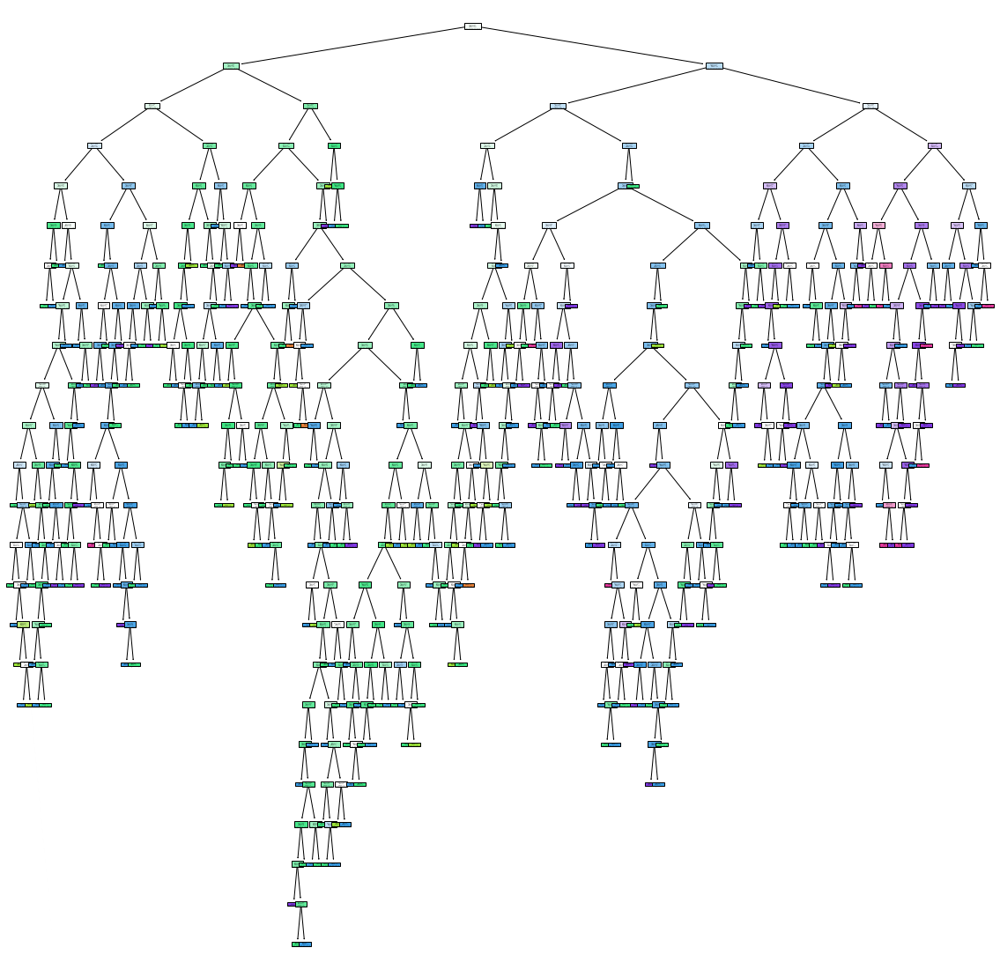

In [16]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [17]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [18]:
df1=df.head(500)

In [19]:
x1=df1.drop(columns='quality')

In [20]:
y1=df1.quality

In [21]:
dt_model1=DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

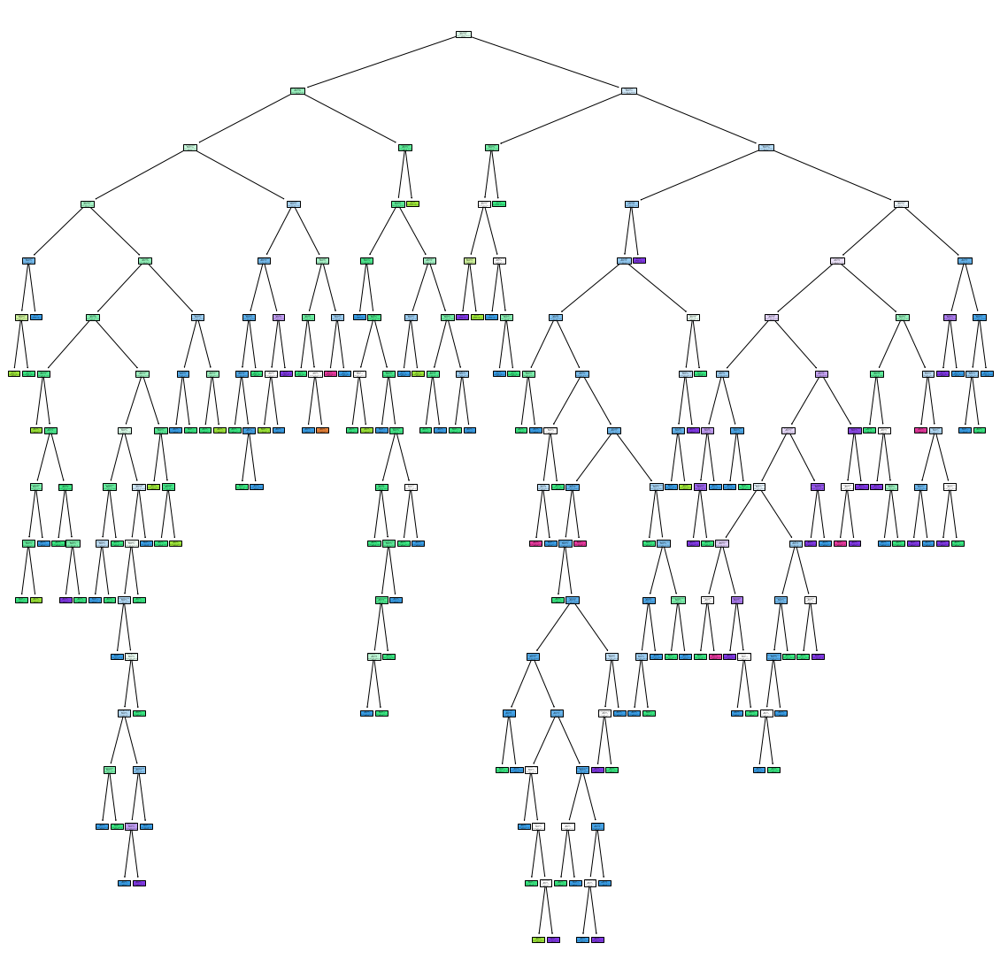

In [22]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] ,feature_names=x1.columns)
plt.savefig('dt_model_1')

In [23]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [24]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [25]:
[str(i) for i in set(y1)]

['3', '4', '5', '6', '7', '8']

In [26]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [27]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [28]:
dt_model1.score(x1,y1)

1.0

In [29]:
dt_model1.score(x_test,y_test)

0.575

In [30]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [31]:
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00203333, 0.00247552, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00272222,
        0.00283333, 0.00285714, 0.003     , 0.003     , 0.003     ,
        0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00328205,
        0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
        0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
        0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
        0.00428571, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
        0.00466667, 0.0048    , 0.00487179, 0.00504242, 0.00508235,
        0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
        0.00656364, 0.00671079, 0.

In [32]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00203333, 0.00247552, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00272222,
       0.00283333, 0.00285714, 0.003     , 0.003     , 0.003     ,
       0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
       0.00428571, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
       0.00466667, 0.0048    , 0.00487179, 0.00504242, 0.00508235,
       0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
       0.00656364, 0.00671079, 0.0067591 , 0.00688352, 0.00688

In [33]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)

Text(0, 0.5, 'score')

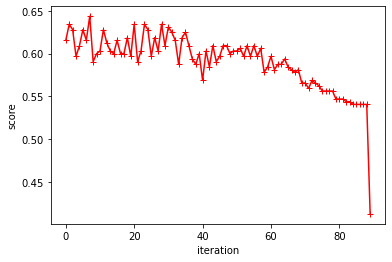

In [34]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [35]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alph

In [36]:
train_score = [i.score(x1,y1) for i in dt_modle2]

In [37]:
test_score = [i.score(x_test ,y_test) for i in dt_modle2]

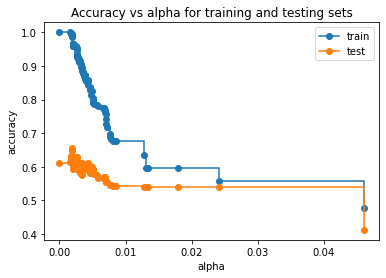

In [38]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [39]:
dt_model_ccp = DecisionTreeClassifier(random_state=0 , ccp_alpha=.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

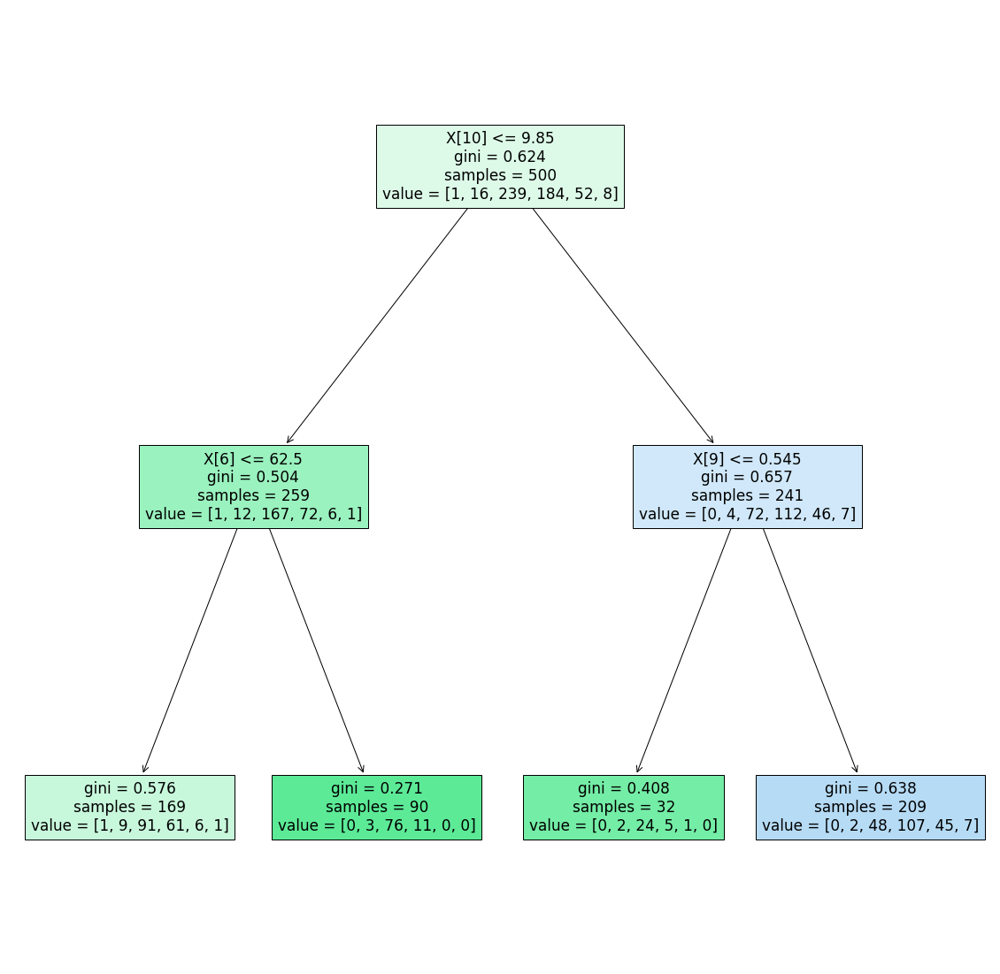

In [40]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [41]:
dt_model_ccp.score(x1,y1)

0.596

In [42]:
dt_model_ccp.score(x_test,y_test)

0.540625

In [43]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [44]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [45]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram , cv = 10 , n_jobs=-1)

In [ ]:
grid_ccp.fit(x1,y1)

C:\Users\Ast_Rishabh\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


In [ ]:
grid_ccp.best_params_

In [54]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=17 ,min_samples_leaf=1 , min_samples_split=3 , splitter='random',ccp_alpha=0.014)

In [55]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [56]:
dt_cpp_new.score(x1,y1)

0.644

In [57]:
dt_cpp_new.score(x_test,y_test)

0.553125

In [58]:
pred = dt_cpp_new.predict(x_train)

In [59]:
confusion_matrix(y_train,pred)

array([[  0,   0,   5,   0,   0,   0],
       [  0,   0,  19,  18,   6,   0],
       [  0,   0, 373, 149,  27,   0],
       [  0,   0, 150, 307,  56,   0],
       [  0,   0,  20, 109,  24,   0],
       [  0,   0,   4,   9,   3,   0]], dtype=int64)